<a href="https://colab.research.google.com/github/Dimas0824/Machine_Learning/blob/main/UTS/uts_machine_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# UTS MACHINE LEARNING

Nama : Muhammad Irsyad Dimas Abdillah

Kelas : TI-3H

No : 20

NIM : 2341720088

In [ ]:
# Import Librarires

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import PowerTransformer, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

plt.style.use('seaborn-v0_8')


## 1. Load dan Cek Dataset

Dataset Default of Credit Card Clients Dataset dimuat dan dilakukan pemeriksaan awal:
- Melihat jumlah baris dan kolom.
- Memeriksa tipe data tiap kolom.
- Menampilkan beberapa contoh data untuk memahami struktur dataset.

$$
\text{Tujuan: memastikan dataset terbaca dengan benar dan memahami struktur awal data.}
$$

---

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Machine Learning/DATASET/UCI_Credit_Card.csv')
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [ ]:
# Cek nilai hilang (NaN)
missing = data.isna().sum()
print(missing[missing > 0] if not missing[missing > 0].empty else "Tidak ada nilai hilang.")

# Cek nilai tak hingga (inf / -inf)
inf_cols = data.columns[data.apply(lambda x: np.isinf(x).any())]
print(f"Kolom dengan inf/-inf: {list(inf_cols)}" if len(inf_cols) > 0 else "Tidak ada nilai inf / -inf.")

# Cek nilai hilang (isnull)
missing_isnull = data.isnull().sum()
print(missing_isnull[missing_isnull > 0] if not missing_isnull[missing_isnull > 0].empty else "Tidak ada nilai hilang (isnull).")

Tidak ada nilai hilang.
Tidak ada nilai inf / -inf.
Tidak ada nilai hilang (isnull).


## 2. Feature Engineering dan Data Preprocessing

Untuk tugas clustering (segmentasi), tujuannya adalah mengelompokkan nasabah dengan karakteristik serupa, bukan memprediksi gagal bayar. Oleh karena itu, fitur dipilih berdasarkan kemampuannya dalam mendefinisikan profil finansial dan perilaku nasabah secara komprehensif.

---

### Fitur yang Dipilih

Fitur-fitur dikelompokkan berdasarkan perannya dalam membentuk segmen nasabah yang bermakna.

#### A. Grup Profil Finansial & Kapasitas
Fitur ini mendefinisikan kapasitas finansial dan tingkat ketergantungan nasabah pada kredit.

- **LIMIT_BAL**: Menunjukkan kapasitas kredit total yang dipercayakan kepada nasabah.  
- **CREDIT_UTILIZATION**: Rasio antara tagihan rata-rata dengan limit kredit (indikator pemanfaatan kredit). Nasabah dengan rasio tinggi umumnya lebih berisiko karena beban utang relatif besar dibandingkan kapasitasnya.  

**Rujukan:**  
Yeh & Lien (2009) menunjukkan bahwa faktor terkait kapasitas kredit dan perilaku pembayaran memiliki pengaruh kuat terhadap risiko gagal bayar.  

*Kutipan Asli:*  
> "The risk of default is significantly related to the credit limit and repayment status, indicating that credit capacity and payment behavior are key factors in distinguishing customer segments."  

**Sumber:**  
Yeh, I. C., & Lien, C. H. (2009). *The comparisons of data mining techniques for the predictive accuracy of credit card clients default*. Expert Systems with Applications, 36(2), 2473–2480.  
[https://doi.org/10.1016/j.eswa.2007.12.020](https://doi.org/10.1016/j.eswa.2007.12.020)

---

#### B. Grup Perilaku & Konsistensi Pembayaran
Fitur ini menangkap kebiasaan, disiplin, dan stabilitas pembayaran nasabah.

- **PAY_0**: Status pembayaran terakhir merupakan indikator paling relevan terhadap perilaku terkini.  
- **AVG_PAY_DELAY**: Rata-rata keterlambatan pembayaran dari enam bulan terakhir.  
- **PAY_RATIO**: Rasio total pembayaran terhadap total tagihan selama enam bulan terakhir.  
- **PAYMENT_VARIABILITY**: Mengukur fluktuasi jumlah pembayaran, yang mencerminkan kestabilan arus kas nasabah.  

**Rujukan:**  
Yeh & Lien (2009) juga menemukan bahwa status keterlambatan pembayaran (variabel PAY_0 hingga PAY_6) adalah prediktor utama dalam membedakan kelompok nasabah, karena menggambarkan perilaku aktual dalam membayar kewajiban.  

*Kutipan Asli:*  
> "Among all variables, repayment status in the recent months plays the most critical role in differentiating defaulters from non-defaulters."  

**Sumber:**  
Yeh, I. C., & Lien, C. H. (2009). *The comparisons of data mining techniques for the predictive accuracy of credit card clients default*. Expert Systems with Applications, 36(2), 2473–2480.  
[https://doi.org/10.1016/j.eswa.2007.12.020](https://doi.org/10.1016/j.eswa.2007.12.020)

---

#### C. Grup Profil Demografis
Fitur ini digunakan untuk memberi konteks dan interpretasi pada klaster yang terbentuk.

- **AGE, SEX, EDUCATION, MARRIAGE**: Setelah klaster terbentuk, data demografis membantu membangun “persona” untuk setiap segmen, seperti *Klaster A: Profesional muda dengan limit tinggi*, atau *Klaster B: Usia lanjut dengan pola keterlambatan kronis*.  

**Rujukan:**  
Menurut Yeh & Lien (2009), variabel demografis tetap penting sebagai pelengkap analisis karena membantu dalam interpretasi segmen pelanggan.  

*Kutipan Asli:*  
> "Demographic attributes such as age, education, and marital status provide additional insights when profiling customer groups after classification or clustering."  

**Sumber:**  
Yeh, I. C., & Lien, C. H. (2009). *The comparisons of data mining techniques for the predictive accuracy of credit card clients default*. Expert Systems with Applications, 36(2), 2473–2480.  
[https://doi.org/10.1016/j.eswa.2007.12.020](https://doi.org/10.1016/j.eswa.2007.12.020)

In [ ]:
# -----------------------------------------------
# A. PROFIL FINANSIAL & KAPASITAS
# -----------------------------------------------
bill_cols = [f'BILL_AMT{i}' for i in range(1, 7)]
pay_amt_cols = [f'PAY_AMT{i}' for i in range(1, 7)]

# Rata-rata tagihan (proxy untuk BALANCE)
data['AVG_BILL_AMT'] = data[bill_cols].mean(axis=1)

# Rata-rata pembayaran (proxy untuk PURCHASES)
data['AVG_PAY_AMT'] = data[pay_amt_cols].mean(axis=1)

# Rasio pemakaian kredit terhadap limit
data['CREDIT_UTILIZATION'] = data['AVG_BILL_AMT'] / data['LIMIT_BAL']
data['CREDIT_UTILIZATION'] = data['CREDIT_UTILIZATION'].replace([np.inf, -np.inf], np.nan).fillna(0)

# Rasio setara BALANCE / PURCHASES
data['BALANCE_PURCHASE_RATIO'] = data['AVG_BILL_AMT'] / (data['AVG_PAY_AMT'] + 1)
data['BALANCE_PURCHASE_RATIO'] = data['BALANCE_PURCHASE_RATIO'].replace([np.inf, -np.inf], np.nan).fillna(0)

# -----------------------------------------------
# B. PERILAKU & KONSISTENSI PEMBAYARAN
# -----------------------------------------------
pay_status_cols = ['PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']

data['AVG_PAY_DELAY'] = data[pay_status_cols].replace(-2, 0).mean(axis=1)
data['TOTAL_PAY_AMT'] = data[pay_amt_cols].sum(axis=1)
data['TOTAL_BILL_AMT'] = data[bill_cols].sum(axis=1)

data['PAY_RATIO'] = data['TOTAL_PAY_AMT'] / (data['TOTAL_BILL_AMT'] + 1)
data['PAY_RATIO'] = data['PAY_RATIO'].clip(0, 1)

data['PAYMENT_VARIABILITY'] = data[pay_amt_cols].std(axis=1) / (data[pay_amt_cols].mean(axis=1) + 1)
data['PAYMENT_VARIABILITY'] = data['PAYMENT_VARIABILITY'].replace([np.inf, -np.inf], np.nan).fillna(0)

print("Feature engineering selesai!")
display(data.head())

Feature engineering selesai!


,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,default.payment.next.month,AVG_BILL_AMT,AVG_PAY_AMT,CREDIT_UTILIZATION,BALANCE_PURCHASE_RATIO,AVG_PAY_DELAY,TOTAL_PAY_AMT,TOTAL_BILL_AMT,PAY_RATIO,PAYMENT_VARIABILITY
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,1,1284.000000,114.833333,0.064200,11.084892,0.333333,689.0,7704.0,0.089422,2.428343
1,2,120000.0,2,2,2,26,-1,2,0,0,...,1,2846.166667,833.333333,0.023718,3.411306,0.500000,5000.0,17077.0,0.292774,0.902244
2,3,90000.0,2,2,2,34,0,0,0,0,...,0,16942.166667,1836.333333,0.188246,9.221063,0.000000,11018.0,101653.0,0.108387,0.854399
3,4,50000.0,2,2,1,37,0,0,0,0,...,0,38555.666667,1398.000000,0.771113,27.559447,0.000000,8388.0,231334.0,0.036259,0.341714
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,0,18223.166667,9841.500000,0.364463,1.851477,-0.333333,59049.0,109339.0,0.540049,1.400684


In [ ]:
# save Dataset
output_path = "credit_card_default_with_features.csv"
data.to_csv(output_path, index=False)

print(f"\nDataset berhasil disimpan ke: {output_path}")



Dataset berhasil disimpan ke: credit_card_default_with_features.csv


## 3. Analisis Distribusi Data Numerik

Pada tahap ini dilakukan visualisasi sebaran data dari tiap kolom untuk menentukan metode scaling apa yang cocok untuk digunakan
    
---

=== CEK SEBARAN DISTRIBUSI DATA NUMERIK (34 KOLOM) ===


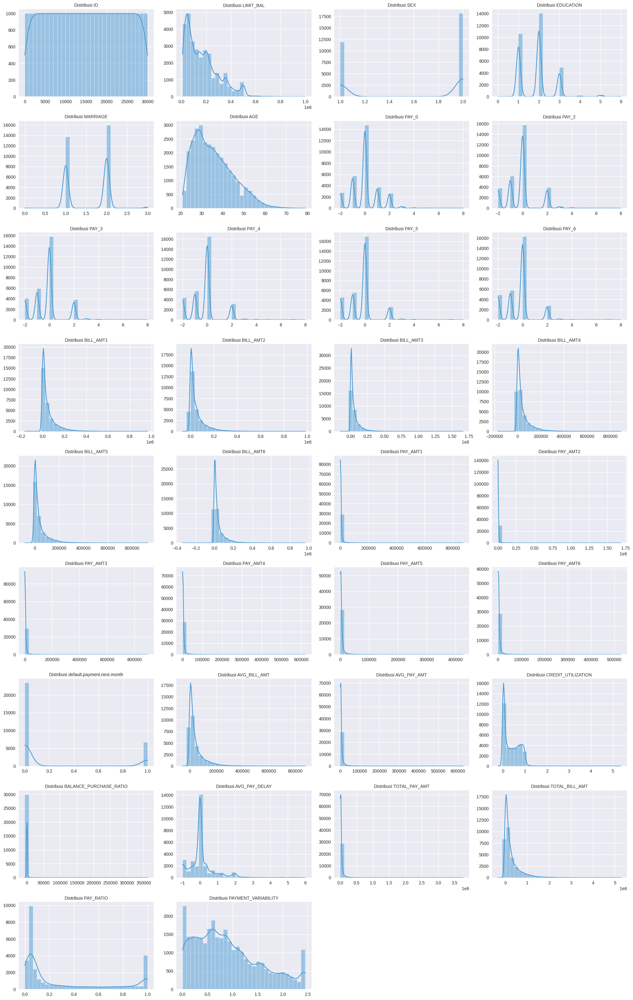

In [ ]:
# === GANTI NILAI inf / -inf DENGAN NaN ===
data_cluster = data.replace([np.inf, -np.inf], np.nan)

# === PILIH HANYA KOLOM NUMERIK ===
num_cols = data_cluster.select_dtypes(include=['int64', 'float64']).columns

print(f"=== CEK SEBARAN DISTRIBUSI DATA NUMERIK ({len(num_cols)} KOLOM) ===")

# === PLOT DISTRIBUSI HISTOGRAM UNTUK SEMUA KOLOM NUMERIK ===
n_cols = 4
n_rows = int(np.ceil(len(num_cols) / n_cols))

plt.figure(figsize=(5 * n_cols, 3.5 * n_rows))
for i, col in enumerate(num_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.histplot(data_cluster[col].dropna(), kde=True, bins=30, color="#4B9CD3", edgecolor="white")
    plt.title(f'Distribusi {col}', fontsize=10)
    plt.xlabel("")
    plt.ylabel("")
plt.tight_layout()
plt.show()

# Behavioral and Demographic-Based Customer Segmentation on Credit Card Clients Using K-Means and DBSCAN Clustering (Integrating Credit Capacity, Payment Behavior, and Demographic Attributes for Enhanced Risk Profiling)

In [ ]:
cuy = pd.read_csv('/content/credit_card_default_with_features.csv')
cuy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 34 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [ ]:
# === DAFTAR FITUR TERPILIH ===
selected_features = [
    # Fitur Asli Penting
    "LIMIT_BAL",              # Kapasitas kredit
    "PAY_0",                  # Status pembayaran terakhir
    "AGE",                    # Umur nasabah
    "SEX",                    # Jenis kelamin
    "EDUCATION",              # Pendidikan
    "MARRIAGE",               # Status pernikahan

    # Semua Fitur Hasil Feature Engineering
    "AVG_BILL_AMT",           # Rata-rata tagihan (proxy BALANCE)
    "AVG_PAY_AMT",            # Rata-rata pembayaran (proxy PURCHASES)
    "BALANCE_PURCHASE_RATIO", # Rasio antara BALANCE dan PURCHASES
    "CREDIT_UTILIZATION",     # Rasio pemakaian kredit terhadap limit
    "AVG_PAY_DELAY",          # Keterlambatan rata-rata pembayaran
    "TOTAL_PAY_AMT",          # Total pembayaran 6 bulan terakhir
    "TOTAL_BILL_AMT",         # Total tagihan 6 bulan terakhir
    "PAY_RATIO",              # Rasio bayar terhadap total tagihan
    "PAYMENT_VARIABILITY"     # Fluktuasi pembayaran (stabilitas perilaku)
]

# === FILTER DATA SESUAI FITUR TERSEDIA ===
data_cluster = data[[col for col in selected_features if col in data.columns]].copy()

# === CEK NILAI INVALID (NaN/Inf) SEBELUM TRANSFORMASI ===
print("\n=== Check for Invalid Values (Sebelum Transformasi) ===")
for col in data_cluster.select_dtypes(include=[np.number]).columns:
    nan_count = data_cluster[col].isna().sum()
    inf_count = np.isinf(data_cluster[col].values).sum()
    print(f"{col} - NaN: {nan_count} | Inf: {inf_count}")


=== Check for Invalid Values (Sebelum Transformasi) ===
LIMIT_BAL - NaN: 0 | Inf: 0
PAY_0 - NaN: 0 | Inf: 0
AGE - NaN: 0 | Inf: 0
SEX - NaN: 0 | Inf: 0
EDUCATION - NaN: 0 | Inf: 0
MARRIAGE - NaN: 0 | Inf: 0
AVG_BILL_AMT - NaN: 0 | Inf: 0
AVG_PAY_AMT - NaN: 0 | Inf: 0
BALANCE_PURCHASE_RATIO - NaN: 0 | Inf: 0
CREDIT_UTILIZATION - NaN: 0 | Inf: 0
AVG_PAY_DELAY - NaN: 0 | Inf: 0
TOTAL_PAY_AMT - NaN: 0 | Inf: 0
TOTAL_BILL_AMT - NaN: 0 | Inf: 0
PAY_RATIO - NaN: 0 | Inf: 0
PAYMENT_VARIABILITY - NaN: 0 | Inf: 0


## 4. Scaling pada Dataset

Pada tahap ini, untuk memperbaiki distribusi data numerik yang memiliki *skew* tinggi atau varians besar, serta agar algoritma berbasis jarak bekerja lebih baik, saya menerapkan **Yeo–Johnson power-transform** terlebih dahulu untuk menyeimbangkan distribusi, kemudian **StandardScaler** untuk menyamakan skala antar fitur (Riani et al., 2023).

### Referensi
- [Riani, M., Atkinson, A. C., & Corbellini, A. (2023). *Automatic robust Box-Cox and extended Yeo–Johnson transformations in regression models*. Springer](https://link.springer.com/article/10.1007/s10260-022-00640-7)

---

In [ ]:
# === SIMPAN DATA ASLI SEBELUM TRANSFORMASI ===
data_cluster_original = data_cluster.copy()

# === COPY DATA UNTUK TRANSFORMASI ===
data_cluster_processed = data_cluster.copy()

# === POWER TRANSFORMER (YEO-JOHNSON) ===
pt = PowerTransformer(method='yeo-johnson', standardize=False)
data_cluster_processed = pd.DataFrame(
    pt.fit_transform(data_cluster_processed),
    columns=data_cluster.columns,
    index=data_cluster.index
)

# === STANDARD SCALER ===
scaler = StandardScaler()
data_cluster_processed = pd.DataFrame(
    scaler.fit_transform(data_cluster_processed),
    columns=data_cluster.columns,
    index=data_cluster.index
)

# === OUTPUT ===
print("\n=== Preprocessing Selesai ===")
print(f"Shape akhir: {data_cluster_processed.shape}")
print(f"Total missing values: {data_cluster_processed.isna().sum().sum()}")

# === STATISTIK DESKRIPTIF ===
print("\n=== Statistik Kolom Setelah Transformasi ===")
display(data_cluster_processed.describe().T[['min', 'max', 'mean', 'std']])

# === UPDATE VARIABEL UTAMA UNTUK CLUSTERING ===
data_cluster = data_cluster_processed.copy()


=== Preprocessing Selesai ===
Shape akhir: (30000, 15)
Total missing values: 0

=== Statistik Kolom Setelah Transformasi ===


,min,max,mean,std
LIMIT_BAL,-2.098927,3.065845,1.269503e-16,1.000017
PAY_0,-2.005396,5.303146,5.684342e-18,1.000017
AGE,-2.155527,2.813880,-2.709536e-15,1.000017
SEX,-1.234323,0.810161,2.330580e-16,1.000017
EDUCATION,-4.435645,3.080580,9.743909e-16,1.000017
MARRIAGE,-3.302841,2.603498,1.345294e-16,1.000017
AVG_BILL_AMT,-37.759105,9.732235,7.721231e-17,1.000017
AVG_PAY_AMT,-2.436105,7.406569,3.306392e-16,1.000017
BALANCE_PURCHASE_RATIO,-67.476609,76.026264,5.684342e-18,1.000017
CREDIT_UTILIZATION,-2.786437,3.439213,-1.103710e-16,1.000017


## 5. Elbow Method

Setelah *scaling* dan *encoding*, untuk menentukan jumlah kluster optimal pada metode **K-Means**, digunakan **Elbow Method**.  
Metode ini mengevaluasi nilai *inertia* dari berbagai jumlah kluster  K  K , lalu memilih titik di mana penurunan *inertia* mulai melambat (titik siku grafik).

$$
\text{Inertia}(K) =
\sum_{i=1}^{K} \sum_{x \in C_i} \|x - \mu_i\|^2
$$

Titik “siku” (*elbow point*) pada grafik menunjukkan jumlah kluster yang optimal, karena setelah titik tersebut peningkatan jumlah kluster tidak memberikan perbaikan signifikan pada hasil klastering.

---

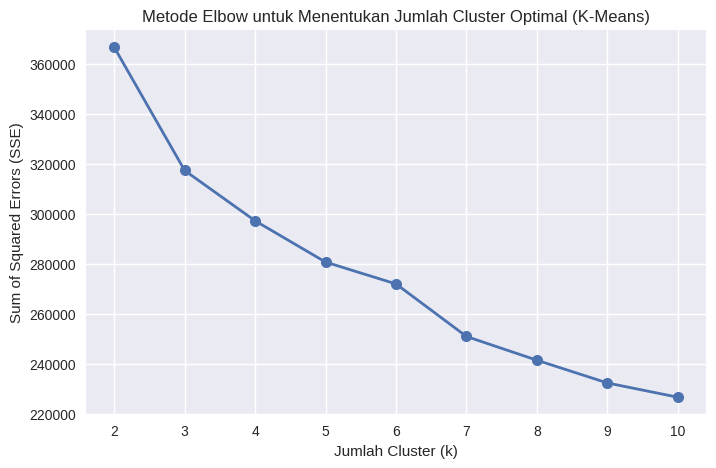


=== Nilai SSE Tiap K ===
k = 2: SSE = 366635.13
k = 3: SSE = 317373.46
k = 4: SSE = 297251.09
k = 5: SSE = 280761.26
k = 6: SSE = 272029.35
k = 7: SSE = 251025.20
k = 8: SSE = 241531.34
k = 9: SSE = 232446.83
k = 10: SSE = 226749.57


In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# === DEFINISIKAN FITUR UNTUK CLUSTERING ===
X = data_cluster.values  # semua kolom numerik hasil transformasi

# === METODE ELBOW ===
sse = []
K = range(2, 11)  # range jumlah cluster yang diuji

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(X)
    sse.append(kmeans.inertia_)

# === VISUALISASI ELBOW ===
plt.figure(figsize=(8, 5))
plt.plot(K, sse, 'o-', linewidth=2, markersize=8)
plt.title("Metode Elbow untuk Menentukan Jumlah Cluster Optimal (K-Means)")
plt.xlabel("Jumlah Cluster (k)")
plt.ylabel("Sum of Squared Errors (SSE)")
plt.grid(True)
plt.show()

# === CETAK NILAI SSE ===
print("\n=== Nilai SSE Tiap K ===")
for k, val in zip(K, sse):
    print(f"k = {k}: SSE = {val:.2f}")

## 6. Clustering dengan K-Means

Setelah jumlah kluster optimal diperoleh dari *Elbow Method*, proses klasterisasi dilakukan menggunakan algoritma **K-Means**.  
Algoritma ini bekerja dengan membagi data ke dalam  K  K  kelompok (kluster) berdasarkan jarak terdekat ke titik pusat (centroid).

Tujuan utama K-Means adalah meminimalkan jumlah kuadrat jarak antar titik data ke centroid klusternya masing-masing.

---

## 7. Visualisasi PCA 2D

Untuk mempermudah interpretasi hasil klasterisasi, digunakan teknik **PCA (Principal Component Analysis)** guna mereduksi dimensi data menjadi 2 atau 3 komponen utama tanpa kehilangan terlalu banyak informasi.

### a. Visualisasi 2D
Dua komponen utama pertama ( PC_1  PC_1  dan  PC_2  PC_2 ) digunakan untuk memetakan setiap pengguna Netflix ke dalam bidang dua dimensi.  
Warna titik menunjukkan kluster hasil K-Means.

---


K-Means (K=5)
Silhouette Score: 0.1772
Davies-Bouldin Index: 1.7643


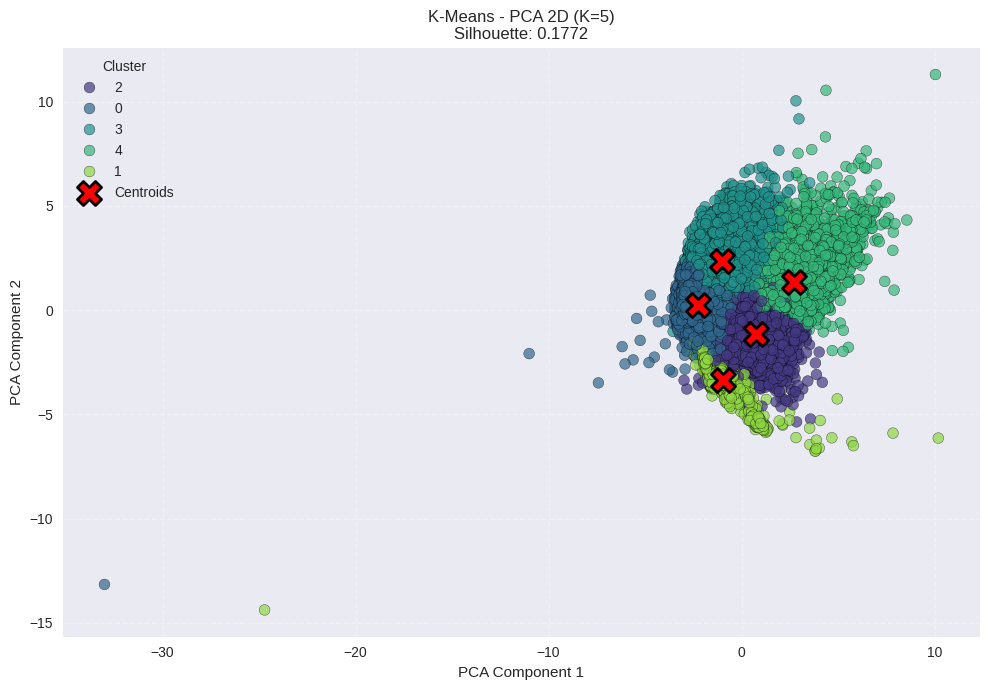

In [ ]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ========================================
# K-MEANS CLUSTERING
# ========================================
optimal_k = 5
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10, max_iter=300)
labels = kmeans.fit_predict(X)

# Evaluation Metrics
silhouette = silhouette_score(X, labels)
davies_bouldin = davies_bouldin_score(X, labels)
print(f"\nK-Means (K={optimal_k})")
print(f"Silhouette Score: {silhouette:.4f}")
print(f"Davies-Bouldin Index: {davies_bouldin:.4f}")

# ========================================
# PCA REDUCTION
# ========================================
pca_2d = PCA(n_components=2, random_state=42)
X_pca_2d = pca_2d.fit_transform(X.values if isinstance(X, pd.DataFrame) else X)

centroids_2d = pca_2d.transform(kmeans.cluster_centers_)

df_viz = pd.DataFrame({
    'pca1': X_pca_2d[:, 0],
    'pca2': X_pca_2d[:, 1],
    'cluster': labels.astype(str)
})

# ========================================
# PCA 2D PLOT
# ========================================
plt.figure(figsize=(10, 7))
sns.scatterplot(
    data=df_viz,
    x='pca1', y='pca2',
    hue='cluster',
    palette='viridis',
    s=60, alpha=0.7,
    edgecolor='k', linewidth=0.3
)
plt.scatter(centroids_2d[:, 0], centroids_2d[:, 1],
            c='red', s=300, marker='X',
            edgecolors='black', linewidth=2,
            label='Centroids')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title(f'K-Means - PCA 2D (K={optimal_k})\nSilhouette: {silhouette:.4f}')
plt.legend(title='Cluster')
plt.grid(True, alpha=0.3, linestyle='--')
plt.tight_layout()
plt.show()

### c. Analisis Kontribusi Komponen PCA
Kontribusi atau *explained variance ratio* menunjukkan seberapa besar proporsi variansi data yang dijelaskan oleh masing-masing komponen utama.

Nilai ini membantu menjelaskan seberapa besar informasi yang masih dipertahankan setelah reduksi dimensi.

---

In [ ]:
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np

X = data_cluster.copy()

# PCA 2D
pca_2d = PCA(n_components=2, random_state=42)
pca_result = pca_2d.fit_transform(X)

print("\n" + "="*50)
print("INTERPRETASI PCA 2D")
print("="*50)

# Variance explained
print("\nVariance Explained:")
print(f"PCA 1: {pca_2d.explained_variance_ratio_[0]:.2%}")
print(f"PCA 2: {pca_2d.explained_variance_ratio_[1]:.2%}")
print(f"Total: {pca_2d.explained_variance_ratio_.sum():.2%}")

# Kontribusi fitur (loading matrix)
print("\nKontribusi Fitur pada Komponen PCA 2D:")
print("-" * 50)

feature_names = X.columns
loadings_2d = pd.DataFrame(
    pca_2d.components_.T,
    columns=['PCA 1', 'PCA 2'],
    index=feature_names
)

loadings_2d['PCA1_abs'] = loadings_2d['PCA 1'].abs()
loadings_2d['PCA2_abs'] = loadings_2d['PCA 2'].abs()

print("\nTop 5 fitur untuk PCA 1:")
display(loadings_2d.nlargest(5, 'PCA1_abs')[['PCA 1']])

print("\nTop 5 fitur untuk PCA 2:")
display(loadings_2d.nlargest(5, 'PCA2_abs')[['PCA 2']])

pca_loadings = loadings_2d.sort_values(by='PCA1_abs', ascending=False)


INTERPRETASI PCA 2D

Variance Explained:
PCA 1: 24.68%
PCA 2: 20.66%
Total: 45.34%

Kontribusi Fitur pada Komponen PCA 2D:
--------------------------------------------------

Top 5 fitur untuk PCA 1:


,PCA 1
CREDIT_UTILIZATION,0.449015
AVG_BILL_AMT,0.435335
TOTAL_BILL_AMT,0.433326
PAY_RATIO,-0.381251
AVG_PAY_DELAY,0.307318



Top 5 fitur untuk PCA 2:


,PCA 2
TOTAL_PAY_AMT,0.492465
AVG_PAY_AMT,0.492313
LIMIT_BAL,0.374127
PAY_RATIO,0.287203
AVG_PAY_DELAY,-0.272332


## 8. Interpretasi dan Ringkasan Klaster

Setelah proses klasterisasi selesai, hasilnya digabungkan kembali dengan data asli (sebelum pelabelan).  
Tahap ini bertujuan untuk memahami karakteristik tiap kluster pengguna Netflix.

### a. Explain Point dengan visualisasi PCA 3 (plotty)
Fungsi *Explain Point* menjelaskan karakteristik satu pengguna berdasarkan fitur-fitur dominan di kluster tempat ia berada.  
Contoh:
> “Pengguna ini tergabung di Cluster 2 — usia 25–30 tahun, lebih suka film Action dan Crime, serta cenderung menonton di malam hari.”

---

Untuk menggunakan Fungsi explain point ini, cukup hover pada titik yang ingin di jelaskan, dan kemudian panggil function dengan cara:
explain_point(42)

dengan itu kode akan menampilkan ringkasan detail tentang poin tersebut.

---

In [ ]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from sklearn.decomposition import PCA

# ========================================
# PERSIAPAN DATA
# ========================================
# X = data yang sudah di-transform (dari kode sebelumnya: data_cluster.values)
# data_cluster_original = data asli sebelum transformasi

# Jika X sudah didefinisikan sebagai numpy array, gunakan data_cluster untuk feature names
if isinstance(X, np.ndarray):
    feature_names = data_cluster.columns.tolist()
else:
    X = data_cluster.copy()
    feature_names = X.columns.tolist()

# ========================================
# Perhitungan PCA 3D (PCA REDUCTION)
# ========================================
pca_3d = PCA(n_components=3, random_state=42)
X_pca_3d = pca_3d.fit_transform(X.values if isinstance(X, pd.DataFrame) else X)

# Transform centroids ke ruang PCA
centroids_3d = pca_3d.transform(kmeans.cluster_centers_)

# DataFrame untuk visualisasi
df_viz = pd.DataFrame({
    'pca3_comp1': X_pca_3d[:, 0],
    'pca3_comp2': X_pca_3d[:, 1],
    'pca3_comp3': X_pca_3d[:, 2],
    'cluster': labels.astype(str)
})

# ========================================
# PERSIAPAN DATA DENGAN ORIGINAL VALUES
# ========================================
# Gunakan data SEBELUM encoding untuk interpretasi
df_analysis = data_cluster_original.copy()  # Data asli sebelum preprocessing
df_analysis['cluster'] = labels
df_analysis['pca1'] = X_pca_3d[:, 0]
df_analysis['pca2'] = X_pca_3d[:, 1]
df_analysis['pca3'] = X_pca_3d[:, 2]
df_analysis['point_id'] = range(len(df_analysis))

print(f"Data siap - Total: {len(df_analysis)} points, Cluster: {df_analysis['cluster'].nunique()}")

# ========================================
# INTERPRETASI PCA 3D
# ========================================
print("\n" + "="*50)
print("INTERPRETASI PCA 3D")
print("="*50)

# Variance explained
print(f"\nVariance Explained:")
for i in range(3):
    print(f"  PCA {i+1}: {pca_3d.explained_variance_ratio_[i]:.2%}")
print(f"  Total: {pca_3d.explained_variance_ratio_.sum():.2%}")

# Loading matrix untuk 3D
print(f"\nKontribusi Fitur pada Komponen PCA 3D:")
print("-" * 50)

loadings_3d = pd.DataFrame(
    pca_3d.components_.T,
    columns=['PCA 1', 'PCA 2', 'PCA 3'],
    index=feature_names
)

for i, col in enumerate(['PCA 1', 'PCA 2', 'PCA 3'], 1):
    loadings_3d[f'{col}_abs'] = loadings_3d[col].abs()
    print(f"\nTop 5 fitur untuk {col}:")
    print(loadings_3d.nlargest(5, f'{col}_abs')[[col]])

# ========================================
# FUNGSI EXPLAIN POINT
# ========================================
def explain_point(point_index):
    """Menjelaskan karakteristik user tertentu dengan data ORIGINAL"""
    if point_index >= len(df_analysis) or point_index < 0:
        print("Index tidak valid!")
        return

    row = df_analysis.iloc[point_index]
    cluster_id = int(row['cluster'])

    print("="*70)
    print(f"{'USER #' + str(point_index) + ' - CLUSTER ' + str(cluster_id):^70}")
    print("="*70)
    print(f"Posisi PCA 3D: ({row['pca1']:.3f}, {row['pca2']:.3f}, {row['pca3']:.3f})")

    # Karakteristik User (DATA ORIGINAL)
    print("\nKARAKTERISTIK:")
    print("-"*70)
    exclude = ['pca1', 'pca2', 'pca3', 'point_id', 'cluster']

    for col in df_analysis.columns:
        if col not in exclude:
            value = row[col]
            if pd.notna(value):
                if isinstance(value, (int, np.integer)):
                    print(f"  • {col:.<30} : {value}")
                elif isinstance(value, (float, np.floating)):
                    print(f"  • {col:.<30} : {value:.2f}")
                else:
                    # Tampilkan nilai kategorikal ASLI (genre_primary: "Action" bukan "9")
                    print(f"  • {col:.<30} : {value}")

    # Info Cluster
    cluster_data = df_analysis[df_analysis['cluster'] == cluster_id]
    print(f"\nCLUSTER INFO:")
    print("-"*70)
    print(f"  Total: {len(cluster_data)} users ({len(cluster_data)/len(df_analysis)*100:.1f}%)")

    # Statistik Numerik (kolom asli yang numerik)
    numeric_cols = [c for c in cluster_data.select_dtypes(include=[np.number]).columns
                    if c not in exclude + ['cluster']]

    if numeric_cols:
        print(f"\n  Perbandingan dengan rata-rata cluster:")
        for col in numeric_cols[:6]:
            cluster_mean = cluster_data[col].mean()
            user_value = row[col]
            diff = ((user_value - cluster_mean) / cluster_mean * 100) if cluster_mean != 0 else 0
            print(f"    {col}: {user_value:.2f} vs {cluster_mean:.2f} ({diff:+.1f}%)")

    # Statistik Kategorikal (DATA ASLI - genre, device, dll)
    categorical_cols = [c for c in cluster_data.select_dtypes(include=['object', 'category']).columns
                       if c not in exclude]

    if categorical_cols:
        print(f"\n  Top kategori di cluster:")
        for col in categorical_cols[:3]:
            top_val = cluster_data[col].mode()[0] if not cluster_data[col].mode().empty else 'N/A'
            top_pct = (cluster_data[col] == top_val).sum() / len(cluster_data) * 100
            user_val = row[col]
            same = "✓" if user_val == top_val else "✗"
            print(f"    {col}: '{top_val}' ({top_pct:.0f}%) {same} User: '{user_val}'")

    print("="*70 + "\n")

# ========================================
# VISUALISASI 3D
# ========================================
def create_3d_plot():
    """Membuat visualisasi 3D interaktif"""

    fig = go.Figure()

    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
              '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

    # Plot setiap cluster
    for cluster_id in sorted(df_analysis['cluster'].unique()):
        cluster_data = df_analysis[df_analysis['cluster'] == cluster_id]

        # Buat hover text dengan DATA ORIGINAL
        hover_texts = []
        for idx, row in cluster_data.iterrows():
            # Prioritas: kategorikal (genre, device) + numerik penting
            cat_cols = [c for c in df_analysis.select_dtypes(include=['object', 'category']).columns
                       if c not in ['pca1', 'pca2', 'pca3', 'point_id', 'cluster']][:3]
            num_cols = [c for c in df_analysis.select_dtypes(include=[np.number]).columns
                       if c not in ['pca1', 'pca2', 'pca3', 'point_id', 'cluster']][:3]

            hover_info = f"<b>Point #{row['point_id']}</b> | Cluster {cluster_id}<br>"
            hover_info += "-" * 35 + "<br>"

            # Tampilkan kategorikal dulu (genre asli, bukan angka)
            for col in cat_cols:
                value = row[col]
                if pd.notna(value):
                    str_val = str(value)[:30] + ('...' if len(str(value)) > 30 else '')
                    hover_info += f"<b>{col}</b>: {str_val}<br>"

            # Lalu numerik
            for col in num_cols:
                value = row[col]
                if pd.notna(value):
                    if isinstance(value, (float, np.floating)):
                        hover_info += f"{col}: {value:.2f}<br>"
                    else:
                        hover_info += f"{col}: {value}<br>"

            hover_texts.append(hover_info)

        # Add scatter
        fig.add_trace(go.Scatter3d(
            x=cluster_data['pca1'],
            y=cluster_data['pca2'],
            z=cluster_data['pca3'],
            mode='markers',
            name=f'Cluster {cluster_id}',
            marker=dict(
                size=4,
                opacity=0.7,
                color=colors[cluster_id % len(colors)]
            ),
            text=hover_texts,
            hovertemplate='%{text}<extra></extra>'
        ))

    # Add centroids
    fig.add_trace(go.Scatter3d(
        x=centroids_3d[:, 0],
        y=centroids_3d[:, 1],
        z=centroids_3d[:, 2],
        mode='markers',
        name='Centroids',
        marker=dict(
            size=10,
            color='red',
            symbol='x',
            line=dict(color='black', width=2)
        ),
        hovertemplate='<b>Centroid %{text}</b><extra></extra>',
        text=[str(i) for i in range(len(centroids_3d))]
    ))

    # Layout
    fig.update_layout(
        title=dict(
            text='<b>PCA 3D Clustering Visualization</b><br>' +
                 '<sub>Rotate & zoom | Hover untuk detail | Catat Point ID → explain_point(id)</sub>',
            x=0.5,
            xanchor='center'
        ),
        scene=dict(
            xaxis_title=f'PCA 1 ({pca_3d.explained_variance_ratio_[0]:.1%})',
            yaxis_title=f'PCA 2 ({pca_3d.explained_variance_ratio_[1]:.1%})',
            zaxis_title=f'PCA 3 ({pca_3d.explained_variance_ratio_[2]:.1%})',
            camera=dict(
                eye=dict(x=1.5, y=1.5, z=1.3)
            )
        ),
        width=1200,
        height=800,
        template='plotly_white',
        legend=dict(
            yanchor="top",
            y=0.99,
            xanchor="left",
            x=0.01,
            bgcolor="rgba(255,255,255,0.9)"
        )
    )

    fig.show()

    print("\nINFO: Gunakan explain_point(point_id) untuk analisis detail")

# ========================================
# EKSEKUSI
# ========================================
create_3d_plot()

Data siap - Total: 30000 points, Cluster: 5

INTERPRETASI PCA 3D

Variance Explained:
  PCA 1: 24.68%
  PCA 2: 20.66%
  PCA 3: 10.58%
  Total: 55.91%

Kontribusi Fitur pada Komponen PCA 3D:
--------------------------------------------------

Top 5 fitur untuk PCA 1:
                       PCA 1
CREDIT_UTILIZATION  0.449015
AVG_BILL_AMT        0.435335
TOTAL_BILL_AMT      0.433326
PAY_RATIO          -0.381251
AVG_PAY_DELAY       0.307318

Top 5 fitur untuk PCA 2:
                  PCA 2
TOTAL_PAY_AMT  0.492465
AVG_PAY_AMT    0.492313
LIMIT_BAL      0.374127
PAY_RATIO      0.287203
AVG_PAY_DELAY -0.272332

Top 5 fitur untuk PCA 3:
                        PCA 3
AGE                  0.609738
MARRIAGE            -0.592756
PAYMENT_VARIABILITY -0.277466
LIMIT_BAL            0.242372
EDUCATION            0.202845



INFO: Gunakan explain_point(point_id) untuk analisis detail


In [ ]:
explain_point(19567)

                       USER #19567 - CLUSTER 3                        
Posisi PCA 3D: (-0.445, 3.186, -1.735)

KARAKTERISTIK:
----------------------------------------------------------------------
  • LIMIT_BAL..................... : 240000.00
  • PAY_0......................... : 0.00
  • AGE........................... : 30.00
  • SEX........................... : 2.00
  • EDUCATION..................... : 2.00
  • MARRIAGE...................... : 2.00
  • AVG_BILL_AMT.................. : 34746.00
  • AVG_PAY_AMT................... : 35793.33
  • BALANCE_PURCHASE_RATIO........ : 0.97
  • CREDIT_UTILIZATION............ : 0.14
  • AVG_PAY_DELAY................. : -0.17
  • TOTAL_PAY_AMT................. : 214760.00
  • TOTAL_BILL_AMT................ : 208476.00
  • PAY_RATIO..................... : 1.00
  • PAYMENT_VARIABILITY........... : 1.65

CLUSTER INFO:
----------------------------------------------------------------------
  Total: 4401 users (14.7%)

  Perbandingan dengan rata-rata c

In [ ]:
import pandas as pd
import numpy as np
from tabulate import tabulate

# ========================================
# MAPPING UNTUK TRANSLATE ENCODED VALUES
# ========================================
FEATURE_MAPPING = {
    'SEX': {
        1: 'Male',
        2: 'Female'
    },
    'EDUCATION': {
        1: 'Graduate School',
        2: 'University',
        3: 'High School',
        4: 'Others',
        5: 'Unknown',
        6: 'Unknown'
    },
    'MARRIAGE': {
        1: 'Married',
        2: 'Single',
        3: 'Others'
    },
    'PAY_0': {
        -1: 'Pay Duly',
        0: 'Revolving Credit',
        1: '1 Month Delay',
        2: '2 Months Delay',
        3: '3 Months Delay',
        4: '4 Months Delay',
        5: '5 Months Delay',
        6: '6 Months Delay',
        7: '7 Months Delay',
        8: '8 Months Delay',
        9: '9+ Months Delay'
    },
}

def translate_value(col_name, value):
    """Translate encoded value ke deskripsi asli dari mapping"""
    if col_name in FEATURE_MAPPING:
        rounded_val = round(value)
        return FEATURE_MAPPING[col_name].get(rounded_val, f"Unknown ({rounded_val})")
    return value


# ========================================
# PERBANDINGAN ANTAR DUA CLUSTER
# ========================================
def compare_clusters(cluster_a, cluster_b):
    df = data_cluster_original.copy()
    df['cluster'] = labels

    if cluster_a not in df['cluster'].unique() or cluster_b not in df['cluster'].unique():
        print("Salah satu cluster tidak ditemukan.")
        return

    num_cols = [col for col in df.columns if col != 'cluster']
    a, b = df[df['cluster'] == cluster_a], df[df['cluster'] == cluster_b]

    print("=" * 80)
    print(f"PERBANDINGAN CLUSTER {cluster_a} VS CLUSTER {cluster_b}")
    print("=" * 80)

    total = len(df)
    print("\n[Ukuran Cluster]")
    size_table = [
        [f"Cluster {cluster_a}", len(a), f"{len(a)/total*100:.1f}%"],
        [f"Cluster {cluster_b}", len(b), f"{len(b)/total*100:.1f}%"]
    ]
    print(tabulate(size_table, headers=["Cluster", "Jumlah Data", "Persentase"], tablefmt="grid"))

    rows = []
    for feature in num_cols:
        mean_a, mean_b = a[feature].mean(), b[feature].mean()
        diff = mean_a - mean_b
        diff_pct = (diff / mean_b * 100) if mean_b != 0 else 0

        if feature in FEATURE_MAPPING:
            trans_a = translate_value(feature, mean_a)
            trans_b = translate_value(feature, mean_b)
            val_a = f"{mean_a:.2f} ({trans_a})"
            val_b = f"{mean_b:.2f} ({trans_b})"
        else:
            val_a, val_b = f"{mean_a:.2f}", f"{mean_b:.2f}"

        rows.append([feature, val_a, val_b, f"{diff:+.2f}", f"{diff_pct:+.1f}%"])

    rows.sort(key=lambda x: abs(float(x[4].replace('%', ''))), reverse=True)
    print("\n[Perbandingan Fitur]")
    print(tabulate(rows, headers=["Feature", f"Cluster {cluster_a}", f"Cluster {cluster_b}", "Selisih", "%Diff"], tablefmt="grid"))

    print("\n[Ringkasan]")
    print(tabulate(
        [[i+1, r[0], r[4]] for i, r in enumerate(rows[:5])],
        headers=["#", "Fitur Paling Berbeda", "%Diff"], tablefmt="grid"
    ))
    print("=" * 80)


# ========================================
# RINGKASAN CLUSTER
# ========================================
def cluster_summary():
    df = data_cluster_original.copy()
    df['cluster'] = labels
    num_cols = [col for col in df.columns if col != 'cluster']

    print("=" * 80)
    print("RINGKASAN CLUSTER")
    print("=" * 80)

    cluster_means = df.groupby('cluster')[num_cols].mean()
    overall = df[num_cols].mean()

    for c in sorted(df['cluster'].unique()):
        sub = df[df['cluster'] == c]
        size, pct = len(sub), len(sub) / len(df) * 100

        # Ambil 3 fitur yang paling berbeda dari overall (berdasarkan persentase selisih)
        diff = (cluster_means.loc[c] - overall) / (overall.replace(0, np.nan)) * 100
        diff = diff.replace([np.inf, -np.inf], np.nan).dropna()
        top_features = diff.abs().nlargest(3).index

        rows = []
        for f in top_features:
            cluster_val = cluster_means.loc[c, f]
            overall_val = overall[f]

            if f in FEATURE_MAPPING:
                trans_cluster = translate_value(f, cluster_val)
                trans_overall = translate_value(f, overall_val)
                rows.append([
                    f,
                    f"{cluster_val:.2f} ({trans_cluster})",
                    f"{overall_val:.2f} ({trans_overall})"
                ])
            else:
                rows.append([
                    f,
                    f"{cluster_val:.2f}",
                    f"{overall_val:.2f}"
                ])

        print(f"\nCluster {c} ({size} data, {pct:.1f}%)")
        print(tabulate(
            rows,
            headers=["Feature", "Rata-rata Cluster", "Rata-rata Overall"],
            tablefmt="grid"
        ))

# ========================================
# INFO PENGGUNAAN
# ========================================
print("compare_clusters(a, b)     -> Bandingkan dua cluster")
print("cluster_summary()          -> Ringkasan tiap cluster")

compare_clusters(a, b)     -> Bandingkan dua cluster
cluster_summary()          -> Ringkasan tiap cluster


In [ ]:
cluster_summary()

RINGKASAN CLUSTER

Cluster 0 (7337 data, 24.5%)
+---------------+---------------------+--------------------------+
| Feature       | Rata-rata Cluster   | Rata-rata Overall        |
+===============+=====================+==========================+
| PAY_0         | -0.71 (Pay Duly)    | -0.02 (Revolving Credit) |
+---------------+---------------------+--------------------------+
| AVG_PAY_DELAY | -0.38               | 0.09                     |
+---------------+---------------------+--------------------------+
| PAY_RATIO     | 0.72                | 0.31                     |
+---------------+---------------------+--------------------------+

Cluster 1 (1439 data, 4.8%)
+------------------------+-------------------------+--------------------------+
| Feature                | Rata-rata Cluster       | Rata-rata Overall        |
+========================+=========================+==========================+
| BALANCE_PURCHASE_RATIO | 2111.57                 | 112.83                   |


## 9. Clustering dengan DBSCAN

Selain K-Means, digunakan juga metode **DBSCAN (Density-Based Spatial Clustering of Applications with Noise)**  
yang berfokus pada **kepadatan (density)** titik data untuk membentuk kluster, serta dapat mengidentifikasi **outlier/noise**.

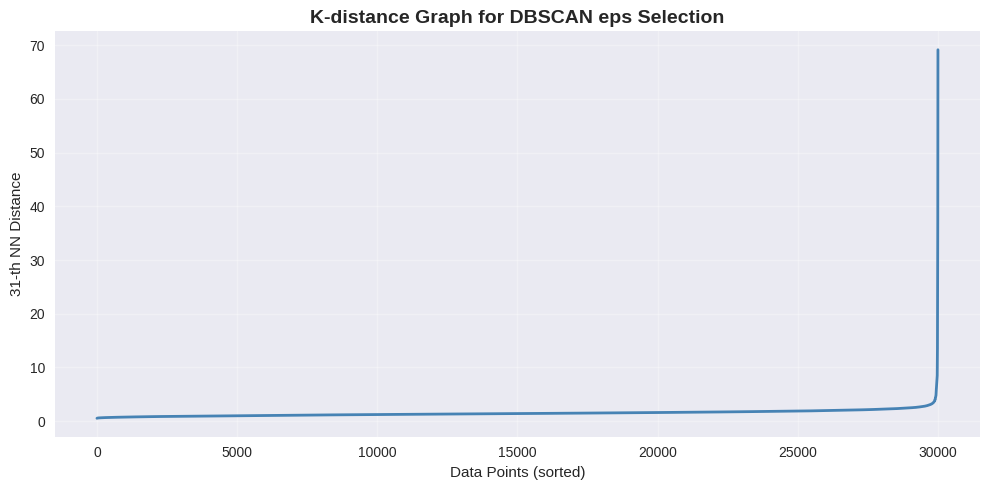

In [ ]:
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import numpy as np

# ========================================
# DBSCAN PARAMETER SELECTION (K-Distance Graph)
# ========================================
k = 31
nbrs = NearestNeighbors(n_neighbors=k).fit(X)
distances, _ = nbrs.kneighbors(X)
distances = np.sort(distances[:, k-1], axis=0)

plt.figure(figsize=(10, 5))
plt.plot(distances, linewidth=2, color='steelblue')
plt.xlabel('Data Points (sorted)')
plt.ylabel(f'{k}-th NN Distance')
plt.title('K-distance Graph for DBSCAN eps Selection', fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


DBSCAN (eps=0.7, min_samples=50)
Number of clusters: 5
Noise points: 29402 (98.01%)
Silhouette Score: 0.5153
Davies-Bouldin Index: 0.7146


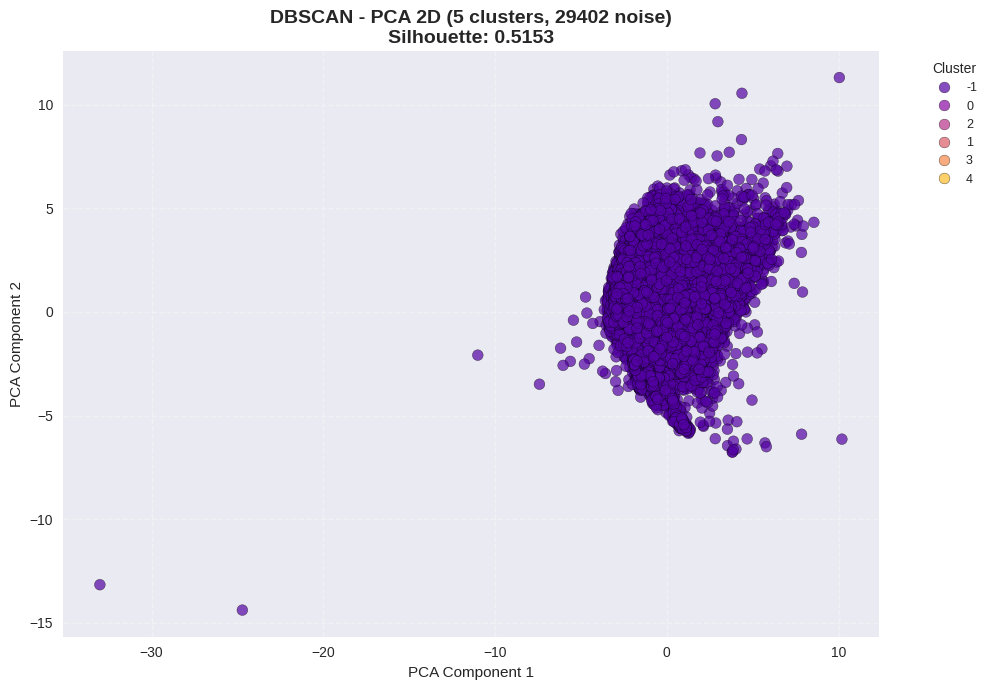

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score
import seaborn as sns
import plotly.express as px
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ========================================
# DBSCAN CLUSTERING
# ========================================
eps_value = 0.7
min_samples_value = 50
dbscan = DBSCAN(eps=eps_value, min_samples=min_samples_value, n_jobs=-1)
labels = dbscan.fit_predict(X)

n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = list(labels).count(-1)

print(f"\nDBSCAN (eps={eps_value}, min_samples={min_samples_value})")
print(f"Number of clusters: {n_clusters}")
print(f"Noise points: {n_noise} ({n_noise/len(labels)*100:.2f}%)")

# Evaluation Metrics
if n_clusters > 1:
    mask = labels != -1
    if mask.sum() > 0:
        silhouette = silhouette_score(X[mask], labels[mask])
        davies_bouldin = davies_bouldin_score(X[mask], labels[mask])
        print(f"Silhouette Score: {silhouette:.4f}")
        print(f"Davies-Bouldin Index: {davies_bouldin:.4f}")
    else:
        silhouette = davies_bouldin = np.nan
        print("Not enough non-noise points for metrics")
else:
    silhouette = davies_bouldin = np.nan
    print("Not enough clusters for metrics")

# ========================================
# PCA DIMENSIONALITY REDUCTION
# ========================================
def to_array(X):
    return X.values if hasattr(X, "values") else X

pca_2d = PCA(n_components=2, random_state=42)
X_pca_2d = pca_2d.fit_transform(to_array(X))
pca_3d = PCA(n_components=3, random_state=42)
X_pca_3d = pca_3d.fit_transform(to_array(X))

df_viz = pd.DataFrame({
    'pca1': X_pca_2d[:, 0],
    'pca2': X_pca_2d[:, 1],
    'pca3_comp1': X_pca_3d[:, 0],
    'pca3_comp2': X_pca_3d[:, 1],
    'pca3_comp3': X_pca_3d[:, 2],
    'cluster': labels.astype(str)
})

# ========================================
# PCA 2D PLOT
# ========================================
plt.figure(figsize=(10, 7))
sns.scatterplot(
    data=df_viz,
    x='pca1', y='pca2',
    hue='cluster',
    palette='plasma',
    s=60, alpha=0.7,
    edgecolor='k', linewidth=0.3
)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
title = f'DBSCAN - PCA 2D ({n_clusters} clusters, {n_noise} noise)'
if not np.isnan(silhouette):
    title += f'\nSilhouette: {silhouette:.4f}'
plt.title(title, fontsize=14, fontweight='bold')
plt.legend(title='Cluster', fontsize=9, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3, linestyle='--')
plt.tight_layout()
plt.show()

# ========================================
# PCA 3D PLOT
# ========================================
fig = px.scatter_3d(
    df_viz,
    x='pca3_comp1',
    y='pca3_comp2',
    z='pca3_comp3',
    color='cluster',
    title=f'DBSCAN - PCA 3D ({n_clusters} clusters, {n_noise} noise)<br>' +
          (f'Silhouette: {silhouette:.4f} | DBI: {davies_bouldin:.4f}' if not np.isnan(silhouette) else 'Metrics: N/A'),
    color_discrete_sequence=px.colors.qualitative.Bold,
    opacity=0.7
)

fig.update_traces(marker=dict(size=3))
fig.update_layout(
    width=900,
    height=700,
    font=dict(size=11),
    title_font=dict(size=14, family='Arial Black'),
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01,
        bgcolor="rgba(255,255,255,0.8)",
        title_text="Cluster<br>(-1 = Noise)"
    )
)
fig.show()

## 10. Clustering dengan Annoy

In [ ]:
!pip install annoy

In [ ]:
# ========================================
# ANNOY CLUSTERING
# ========================================
import time
from annoy import AnnoyIndex
from sklearn.metrics.pairwise import euclidean_distances

# Siapkan data untuk Annoy
X = data_cluster.values.astype(np.float32)
n_samples, n_features = X.shape

print(f"Jumlah data: {n_samples}")
print(f"Jumlah fitur: {n_features}")
print(f"Shape data: {X.shape}")

Jumlah data: 30000
Jumlah fitur: 15
Shape data: (30000, 15)


In [ ]:
# Build Annoy Index
n_trees = 10
metric = 'euclidean' # menggunakan euclidean karena data telah di normalisasi dan scaling

print("Building Annoy index...")
print(f"- Trees: {n_trees}")
print(f"- Metric: {metric}")

start_build = time.time()
annoy_index = AnnoyIndex(n_features, metric)

for i in range(n_samples):
    annoy_index.add_item(i, X[i])

annoy_index.build(n_trees)
build_time = time.time() - start_build

print(f"✓ Build selesai dalam {round(build_time, 3)} detik")

Building Annoy index...
- Trees: 10
- Metric: euclidean
✓ Build selesai dalam 0.258 detik


In [ ]:
# Test Query: Exact NN vs Annoy
query_idx = np.random.randint(0, n_samples)
query_point = X[query_idx]
n_neighbors = 5

print(f"Query index: {query_idx}")
print(f"Mencari {n_neighbors} tetangga terdekat...\n")

# Exact NN (Brute Force)
start = time.time()
distances = np.linalg.norm(X - query_point, axis=1)
idx_exact = np.argsort(distances)[:n_neighbors]
time_exact = time.time() - start

print("Exact NN")
print(f"Index: {idx_exact}")
print(f"Jarak: {distances[idx_exact]}")
print(f"Waktu: {round(time_exact*1000, 4)} ms\n")

# Annoy NN (Approximate)
start = time.time()
idx_annoy = annoy_index.get_nns_by_item(query_idx, n_neighbors)
time_annoy = time.time() - start
annoy_distances = [annoy_index.get_distance(query_idx, i) for i in idx_annoy]

print("Annoy NN")
print(f"Index: {idx_annoy}")
print(f"Jarak: {annoy_distances}")
print(f"Waktu: {round(time_annoy*1000, 4)} ms\n")

# Perbandingan
print("Perbandingan")
print(f"Speedup: {round(time_exact/time_annoy, 2)}x")
print(f"Akurasi: {len(set(idx_exact) & set(idx_annoy))}/{n_neighbors} sama")

Query index: 19794
Mencari 5 tetangga terdekat...

Exact NN
Index: [19794 11633  7604 23163 19125]
Jarak: [0.         0.57609624 0.65243477 0.7856165  0.82574594]
Waktu: 3.8273 ms

Annoy NN
Index: [19794, 11633, 7604, 23163, 19125]
Jarak: [0.0, 0.57609623670578, 0.652434766292572, 0.7856165170669556, 0.8257459402084351]
Waktu: 0.1473 ms

Perbandingan
Speedup: 25.98x
Akurasi: 5/5 sama


In [ ]:
# Eksperimen jumlah trees
tree_values = [3, 8, 10, 20, 50]
results = []

print("Eksperimen dengan berbagai jumlah trees...\n")

for n_tree in tree_values:
    ann_idx = AnnoyIndex(n_features, 'euclidean')
    for i in range(n_samples):
        ann_idx.add_item(i, X[i])

    start = time.time()
    ann_idx.build(n_tree)
    build_time = time.time() - start

    start = time.time()
    idx_ann = ann_idx.get_nns_by_item(query_idx, n_neighbors)
    query_time = time.time() - start

    accuracy = len(set(idx_exact) & set(idx_ann)) / n_neighbors * 100

    results.append({
        'Trees': n_tree,
        'Build Time (s)': round(build_time, 4),
        'Query Time (ms)': round(query_time * 1000, 4),
        'Accuracy (%)': round(accuracy, 2)
    })

df_results = pd.DataFrame(results)
print(df_results.to_string(index=False))

Eksperimen dengan berbagai jumlah trees...

 Trees  Build Time (s)  Query Time (ms)  Accuracy (%)
     3          0.0622           0.0317          60.0
     8          0.1567           0.0505          80.0
    10          0.1705           0.0491         100.0
    20          0.5082           0.0918         100.0
    50          1.7859           0.2248         100.0


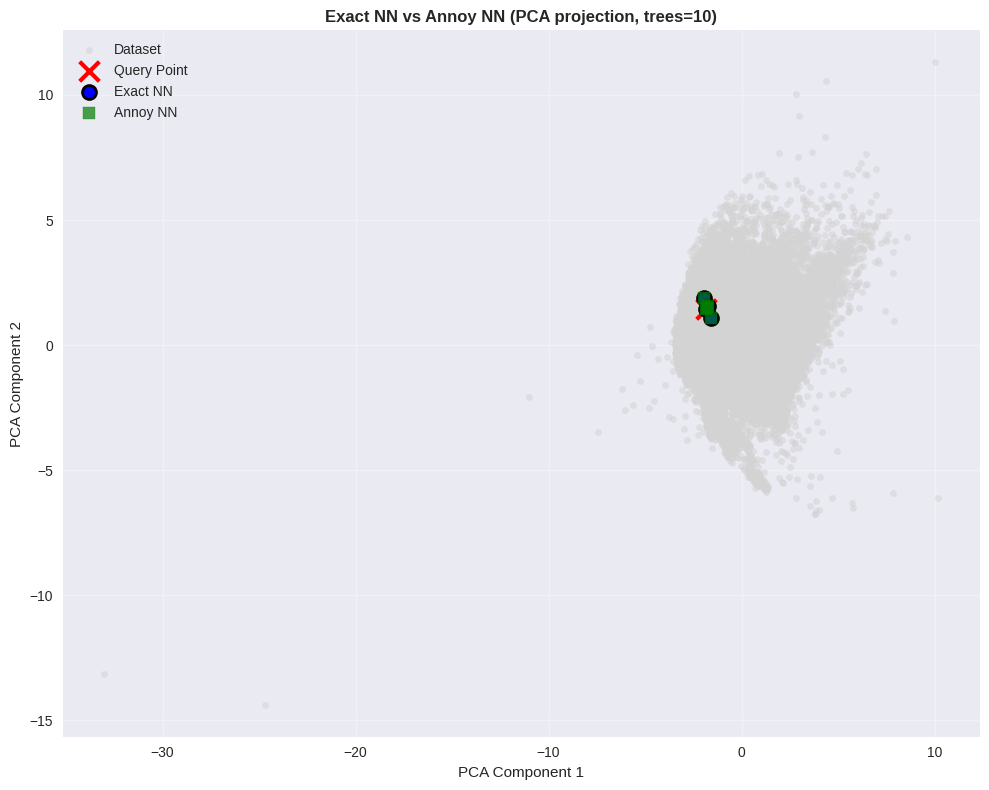

In [ ]:
# PCA reduksi ke 2 dimensi
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X)

# Visualisasi hasil
plt.figure(figsize=(10, 8))

plt.scatter(X_pca[:, 0], X_pca[:, 1], c='lightgray', s=20, alpha=0.5, label='Dataset')
plt.scatter(pca.transform([query_point])[0, 0],
            pca.transform([query_point])[0, 1],
            c='red', marker='x', s=200, linewidths=3, label='Query Point')
plt.scatter(X_pca[idx_exact, 0], X_pca[idx_exact, 1],
            c='blue', s=100, marker='o', label='Exact NN',
            edgecolors='black', linewidths=2)
plt.scatter(X_pca[idx_annoy, 0], X_pca[idx_annoy, 1],
            c='green', s=80, marker='s', label='Annoy NN', alpha=0.7)

plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title(f'Exact NN vs Annoy NN (PCA projection, trees={n_trees})', fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
# Cari nearest neighbors untuk semua data
k = 5
print(f"Mencari {k} nearest neighbors untuk semua data...")

start = time.time()
all_neighbors = []
for i in range(n_samples):
    neighbors = annoy_index.get_nns_by_item(i, k)
    all_neighbors.append(neighbors)
time_all = time.time() - start

print(f"✓ Selesai dalam {round(time_all, 3)} detik")
print(f"Rata-rata {round(time_all/n_samples*1000, 4)} ms per query")

# Contoh hasil untuk 5 data pertama
print("\nContoh neighbors untuk 5 data pertama:")
for i in range(min(5, n_samples)):
    print(f"Data {i}: {all_neighbors[i][:5]}...")

Mencari 5 nearest neighbors untuk semua data...
✓ Selesai dalam 0.502 detik
Rata-rata 0.0167 ms per query

Contoh neighbors untuk 5 data pertama:
Data 0: [0, 9093, 9339, 19506, 15732]...
Data 1: [1, 12877, 383, 15187, 1327]...
Data 2: [2, 20054, 1684, 2207, 17245]...
Data 3: [3, 17486, 13595, 19068, 22720]...
Data 4: [4, 14198, 11237, 10299, 26987]...


In [ ]:
# Perbandingan berbagai distance metrics
metrics = ['euclidean', 'angular', 'manhattan']
metric_results = []

print("Membandingkan berbagai distance metrics...\n")

for metric in metrics:
    ann = AnnoyIndex(n_features, metric)
    for i in range(n_samples):
        ann.add_item(i, X[i])
    ann.build(10)

    start = time.time()
    idx = ann.get_nns_by_item(query_idx, n_neighbors)
    query_time = time.time() - start

    metric_results.append({
        'Metric': metric,
        'Query Time (ms)': round(query_time * 1000, 4),
        'Result': idx
    })

    print(f"{metric:10s}: {round(query_time*1000, 4)} ms | {idx}")

print("\n✓ Perbandingan selesai")

Membandingkan berbagai distance metrics...

euclidean : 0.0813 ms | [19794, 11633, 7604, 23163, 19125]
angular   : 0.0701 ms | [19794, 11633, 7604, 17565, 23163]
manhattan : 0.0546 ms | [19794, 7604, 11633, 23163, 5661]

✓ Perbandingan selesai
